# Eyes For Relighting Implementation
[Paper](http://www1.cs.columbia.edu/CAVE/publications/pdfs/Nishino_TOG04.pdf)

### Imports & Settings

In [2]:
import os
import numpy as np
from PIL import Image, ImageDraw
import menpo.io as mio
import imageio
import cv2
import imutils
from mpl_toolkits.mplot3d import Axes3D

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import matplotlib.pyplot as plt

from menpodetect import load_dlib_frontal_face_detector
from menpofit.aam import load_balanced_frontal_face_fitter
from menpo.shape import PointCloud

%matplotlib inline

In [3]:
# Get the eye
LANDMARK_GROUP = 'rightEye'
TEST_CALIB = './data/eyes/120205115525/calib_2C.tka'
TEST_IMG = './data/eyes/120205115525/2C.png'
RIGHT_EYE_LANDS_IDS = [43, 44, 46, 47]
UPL, UPR, DOL, DOR = 0, 1, 3, 2
CROP_BOUNDARY = 20

### Import Image

In [4]:
def load_image(path):
    """
    Load frontal face
    """
    return mio.import_image(path)

### Get the Eye

In [5]:
def landmark_eye(img):
    """
    Landmark the image using Menpo Fit.
    """
    # Load Detectors
    detector = load_dlib_frontal_face_detector()
    fitter = load_balanced_frontal_face_fitter()
    
    # Fit a box around the face
    bboxes = detector(img)
    fr = fitter.fit_from_bb(img, bboxes[0])
    
    # Get Landmarks for the right eye
    lands_mask = np.zeros(68, dtype=np.bool)
    for i in RIGHT_EYE_LANDS_IDS:
        lands_mask[i] =True

    img.landmarks[LANDMARK_GROUP] = fr.final_shape.from_mask(lands_mask)
    
    return img

def crop_eye(img, boundary=CROP_BOUNDARY):
    """
    Crop the landmarked eye from the face.
    """
    return img.crop_to_landmarks(group=LANDMARK_GROUP, boundary=boundary)

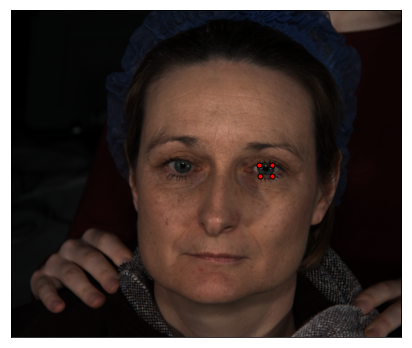

In [6]:
%matplotlib inline
img = landmark_eye(load_image(TEST_IMG))
img.view()
img.landmarks[LANDMARK_GROUP].view(new_figure=False)

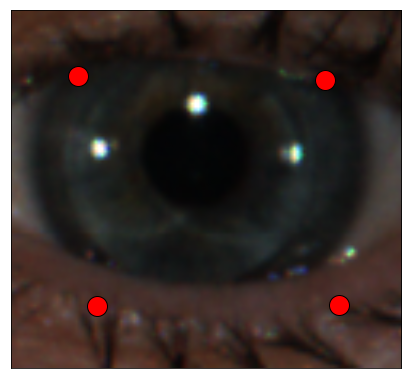

In [7]:
eye = crop_eye(img, 20)
eye.view()
eye.landmarks[LANDMARK_GROUP].view(new_figure=False, marker_size=20)

### Fit the Ellipse
<s>Ellipse</s> Circle fitting using openCV. Since we only have frontal captures, the eyes should remain circular.

In [8]:
def detect_iris(img, dp=5, minDist=100):
    '''
    Detect the iris inside the given eye using opencv's HoughCircles,
    on a grayscaled version of the eye.
    
    @param eye cropped image of the eye, as a menpo.Image
    '''
    # Convert to grayscale
    full_img = np.array(img.as_PILImage())
    eyecv = np.array(crop_eye(img, 20).as_PILImage())
    eye_g = cv2.cvtColor(eyecv[:, :, ::-1], cv2.COLOR_BGR2GRAY)
    
    # Set params
    _, t = cv2.threshold(eye_g, 50, 255, cv2.THRESH_BINARY)
    c = cv2.HoughCircles(t, cv2.HOUGH_GRADIENT, dp, minDist)
    
    if c is not None:
        
        # Get params back on main picture
        c = np.round(c[0, :]).astype('int')[0]
        xpad = img.landmarks[LANDMARK_GROUP].points[0][1] - CROP_BOUNDARY
        ypad = img.landmarks[LANDMARK_GROUP].points[0][0] - CROP_BOUNDARY
        c = np.array([c[0] + xpad, c[1] + ypad, c[1]])
        print(c)
        for (x, y, r) in [c]:
            cv2.circle(full_img, (int(x), int(y)), int(r), (0, 255, 0), 4)
    else:
        raise "No iris found"
            
    return c, Image.fromarray(full_img)

[ 1598.67659009  1002.28374948    48.        ]


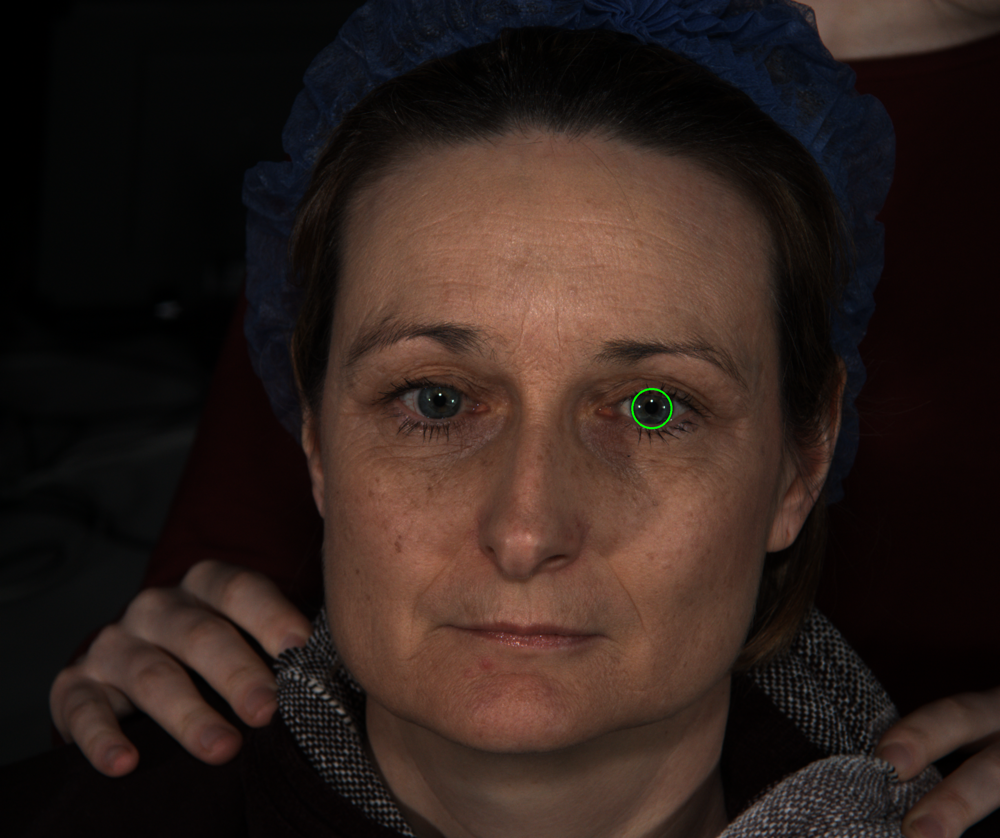

In [9]:
iris, picture = detect_iris(img)
picture

### Get light spots
$S(t, \theta)$

In [10]:
def get_highlights(img):
    """
    Mask the highlights from the iris.
    """
    
    # pre-process image
    full_img = np.array(img.as_PILImage())
    eyecv = np.array(crop_eye(img, 20).as_PILImage())
    gray = cv2.cvtColor(eyecv, cv2.COLOR_BGR2GRAY)
    gray_blurred = cv2.medianBlur(gray, 3)
    
    # threshold image
    _, thresh = cv2.threshold(gray_blurred, 120, 255, cv2.THRESH_BINARY)

    # Detect circles
    circles = cv2.HoughCircles(thresh, cv2.HOUGH_GRADIENT, 1, 20,
                              param1=100, param2=5, minRadius=2, maxRadius=1)
    
    # Get coords on whole image
    xpad = img.landmarks[LANDMARK_GROUP].points[0][1] - CROP_BOUNDARY
    ypad = img.landmarks[LANDMARK_GROUP].points[0][0] - CROP_BOUNDARY
    c = []
    for i in circles[0, :]:
        c.append([i[0] + xpad, i[1] + ypad, i[2]])
    circles = np.array(c)
    print(circles)
    cols = [(255, 0, 0), (0, 255, 0), (255, 255, 0)]
    for i, v in enumerate(circles):
        cv2.circle(full_img, (int(v[0]), int(v[1])), int(v[2]), cols[i], 4)
    cv2.circle(full_img, (int(iris[0]), int(iris[1])), int(iris[2]), (255, 255, 255), 4)

    
    return circles, full_img

[[ 1598.17659009   983.78374948     3.        ]
 [ 1630.17659009   998.78374948     3.        ]
 [ 1568.17659009   997.78374948     3.        ]]


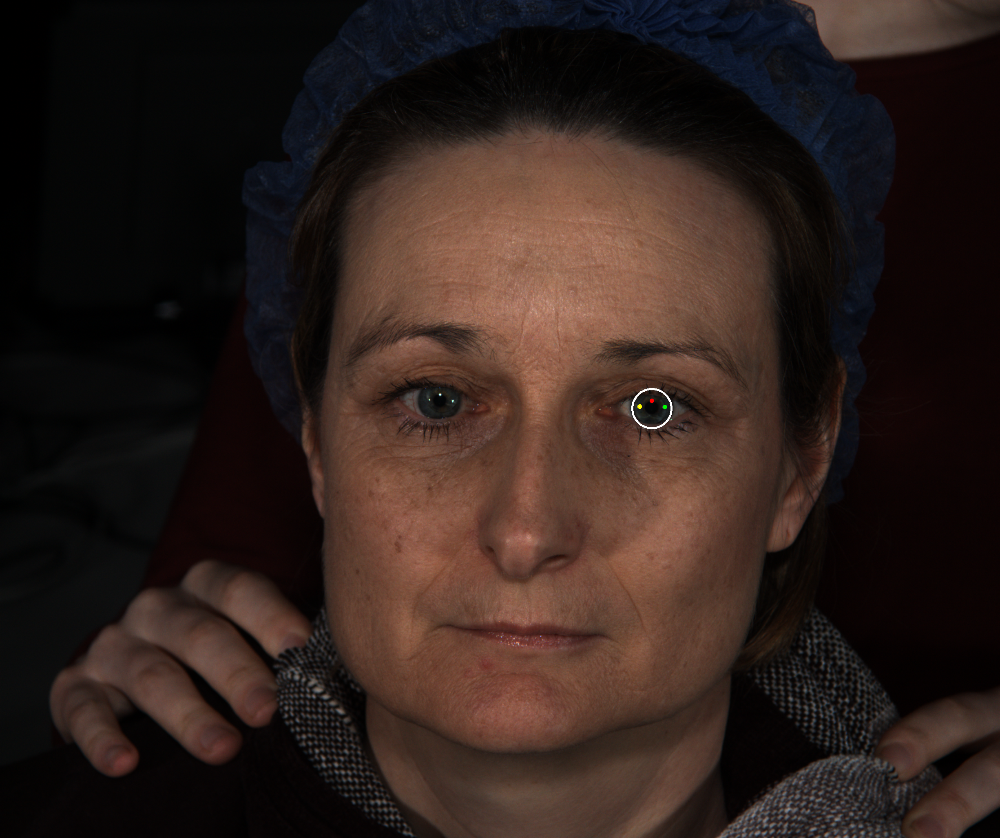

In [11]:
circles, with_highlights = get_highlights(img)
Image.fromarray(with_highlights)

### Get camera callibration

In [12]:
def pixel_to_mm(r_mm, r_pix, u, v):
    """
    Convert the pixel distance to mm.
    """
    s = r_mm / r_pix
    return u * s, v * s

In [14]:
class Camera:
    def __init__(self, data):
        self.f = float(data[7].split(' ')[1])
        self.pixel_size = float(data[11].split(' ')[1])
        self.pic_size = [int(data[15].split(' ')[1]),
                        int(data[15].split(' ')[2])]
        self.cu = float(data[13].split(' ')[1])
        self.cv = float(data[14].split(' ')[1])
        
        self.f_pixels, self.scale = self.get_pixel_focal_distance()
        
    def get_pixel_focal_distance(self):
        """
        focal_pixel = (focal_mm / sensor_width_mm) * image_width_in_pixels
        """
        focal_mm = self.f
        image_width_in_pixels = self.pic_size[1]
        sensor_width_mm = self.pixel_size * image_width_in_pixels
        
        return self.f / sensor_width_mm * image_width_in_pixels, sensor_width_mm * image_width_in_pixels

        
    def __str__(self):
        return 'Focal: {}mm, {}pixels\nPixSize: {}\nPixels: [{}, {}]\nCenter: [{}, {}]'.format(
            self.f, int(self.f_pixels), self.pixel_size, self.pic_size[0], self.pic_size[1], int(self.cu), int(self.cv))
    
def get_calib_settings(calib_dir=TEST_CALIB):
    """
    Create a Camera object with calibration settings.
    """
    with open(calib_dir, 'r') as calib_file:
        calib_data = calib_file.readlines()
    calib_data = [d.strip('\n') for d in calib_data]
    
    return Camera(calib_data)


cam = get_calib_settings()
print(cam)

Focal: 47.1916931mm, 10148pixels
PixSize: 0.00465
Pixels: [2452, 2056]
Center: [1272, 999]


In [28]:
cam.pixel_size * cam.pic_size[0]

11.4018

### Vectors

In [22]:
class Tsuruma:
    """
    All distances in pixels. Implementation of Tsurumas model of camera-eye-highlights.
    """
    def __init__(self, camera, img, iris, highlights):
        # Camera Details
        self.x0, self.y0 = camera.cu, camera.cv
        self.a  = camera.f_pixels
        self.pix_size = camera.pixel_size
        self.mm_to_pix_scale = camera.scale
        # highlights
        self.Xi = highlights[:, 0]
        self.Yi = highlights[:, 1]
        self.hNo = len(self.Xi)
        # eye
        self.xc, self.yc, self.r = iris 
        # calculations
        self.correct_y_orientations()
        self.V = self.get_V()
        self.N = self.get_N()
        self.L = self.get_L()
        self.lx, self.ly, self.lz = self.get_light_positions()
        # For plotting
        self.photoX, self.photoY, self.photoZ = self.get_photo_coords()
        self.eyez = self.a + self.r
        
    def get_V(self):
        """
        Get the directional vector of the camera for each highlight using
        V = [Xi - x0, Yi - y0, -a]
        """
        V = np.empty(shape=(self.hNo, 3))
        for i in range(self.hNo):
            V[i, :] = [
                -(self.Xi[i] - self.x0),
                self.Yi[i] - self.y0,
                -self.a
            ]
        return V
    
    def get_N(self):
        """
        Get the surface normal vector for each highlight using
        N = [Xi - xc, Yi - yc, sqr(r^2 - (Xi - xc)^2 - (Yi - yc)^2)]
        """
        N = np.empty(shape=(self.hNo, 3))
        for i in range(self.hNo):
            xvec = self.Xi[i] - self.xc
            yvec = self.Yi[i] - self.yc
            N[i, :] = [
                xvec,
                yvec,
                np.sqrt(
                    np.square(self.r) - np.square(xvec) - np.square(yvec)
                )
            ]
        return N
    
    def get_L(self):
        """
        Get the direction of light source on the eye for each highlight using
        L = V - 2(N^T . V) N
        """
        L = np.empty(shape=(self.hNo, 3))
        for i in range(self.hNo):
            L[i, :] = self.V[i, :] - 2 * np.dot( self.N[i, :].T, self.V[i, :]) * self.N[i, :]
        return L
    
    def get_photo_coords(self):
        """
        Get five points that define the photos coordinates in 3d space
        """
        x = [0, self.x0*2, self.x0*2, 0, 0]
        y = [0, 0, self.y0*2, self.y0*2, 0]
        z = [self.a, self.a, self.a,self.a, self.a]
        return x, y, z
    
    def correct_y_orientations(self):
        """
        The image is read with 0,0 top right corner, while the world sees it bottom right,
        so we revert all the values.
        """
        m = 2 * self.y0
        self.Yi = m - self.Yi
        self.yc = m - self.yc
        
        
    def plot(self):
        """
        Plot the results of Tsuruma in a similar fashiog as the Figure 2 in the paper.
        """
        # Get Plot
        fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
        ax  = fig.add_subplot(111, projection='3d')
        
        # Plot Settings
        ax.set_xlabel('X Label')
        ax.set_ylabel('Z Label')
        ax.set_zlabel('Y Label')
        ax.set_xlim3d(-6000, 10000)
        ax.set_ylim3d(-6000, 10000)
        ax.set_zlim3d(-6000, 10000)
        
        
        # Data
        ## Eye
        ax.scatter(self.xc, self.a, self.yc, c='lightgrey', s=500, label='eye', alpha=.5)
        ## Cam
        ax.scatter(self.x0, 0., self.y0, c='black', s=500, label='camera')
        ## Picture
        ax.plot(self.photoX, self.photoZ, self.photoY, c='black', label='photo')
        ## Highlights
        ax.scatter(self.Xi, [self.a, self.a, self.a], self.Yi, c='red', s=6, label='highlights')
        
        ## V: Directional Vector of Camera
        ax.plot([self.Xi[1], self.x0], [self.a, 0], [self.Yi[1], self.y0], label='V (Camera View)', c='lightgreen')
        ax.quiver(self.Xi[1], self.a, self.Yi[1], self.V[1, 0], self.V[1, 2], self.V[1, 1], 
                  length=2000, normalize=True, alpha=0.5)
        
        ## N: Normals
        ax.quiver(self.xc, self.eyez, self.yc, self.N[:, 0], -self.N[:, 2], self.N[:, 1], 
                     length=2000, normalize=True, label='N (Normals)', alpha=0.5)
    
        ## L: Light View
        ax.quiver(self.Xi[1], self.a, self.Yi[1], self.L[:, 0], -self.L[:, 2], self.L[:, 1],
                 length=8000, normalize=True)
        
        ## Light Positions
        for i in range(self.hNo):
            ax.scatter(self.lx[i], self.lz[i], self.ly[i], c='yellow', label='lights', s=500)
            ax.plot([self.lx[i], self.lx[i]], [self.lz[i], self.lz[i]], [self.ly[i], 0], 'r--')
            ax.plot([self.lx[i], self.Xi[i]], [self.lz[i], self.a], [self.ly[i], self.Yi[i]], 'r--')
            
        self.lx, self.ly, self.lz = self.get_light_positions_triangle()
        for i in range(self.hNo):
            ax.scatter(self.lx[i], self.lz[i], self.ly[i], c='orange', label='lights', s=500)
            ax.plot([self.lx[i], self.lx[i]], [self.lz[i], self.lz[i]], [self.ly[i], 0], 'r--')
            ax.plot([self.lx[i], self.Xi[i]], [self.lz[i], self.a], [self.ly[i], self.Yi[i]], 'r--')

        # Show
        ax.legend()
        plt.show()
        
    def get_light_positions(self):
        """
        Get the position of the lights using the computed normals.
        For the moment, we assume the lights and the camera to be mounted on a plane,
        parallel to the captured image.
        For z = 0,
        y = y0 - x0/vx*vy, z = likewise
        """
        lz = [0. for i in range(self.hNo)]
        lx = self.Xi - self.a * self.L[:, 0] / self.L[:, 2]
        ly = self.Yi + self.a * self.L[:, 1] / self.L[:, 2]

        return lx, ly, lz
    
    def get_light_positions_triangle(self):
        """
        Get the position of the lights using the computed normals.
        Here we assume that the central light is above the camera and
        the other two are placed at equal distance left and right.
        then use use (x0, y0, z0) + d*u, u = L/|L|
        """
        self.lx, self.ly, self.lz = self.get_light_positions()
        d = np.sqrt((self.Xi[0] - self.lx[0]) ** 2 + (self.Yi[0] - self.ly[0]) ** 2 + (self.a - self.lz[0]) ** 2 )
        u = np.empty_like(self.L)
        
        for i in range(self.hNo):
            u[i, :] = self.L[i, :] / np.linalg.norm(self.L[i, :])
            
        lx = self.Xi + d * u[:, 0]
        ly = self.Yi + d * u[:, 1]
        lz = self.a  - d * u[:, 2]

        return lx, ly, lz
    
    def get_light_positions_mm(self):
        """
        Export the light positions for the render. The center is set as the mesh, not camera
        and the distance is in cm.
        """
        self.lx, self.ly, self.lz = self.get_light_positions()
        
        t = 1. / self.mm_to_pix_scale * 10
        
        print("on the same plane")
        for i in range(self.hNo):
            x = t * self.lx[i] 
            y = t * self.ly[i] 
            z = t * self.a
            print(x, y, z)
    
    def get_light_positions_mm_triangle(self):
        """
        Export the light positions for the render. The center is set as the mesh, not camera
        and the distance is in cm.
        """
        self.lx, self.ly, self.lz = self.get_light_positions_triangle()
        
        t = 1. / self.mm_to_pix_scale * 10
        
        print("same distance")
        for i in range(self.hNo):
            x = t * self.lx[i] 
            y = t * self.ly[i] 
            z = t * (self.a - self.lz[i])
            print(x, y, z)
    


In [23]:
t = Tsuruma(cam, img, iris, circles)

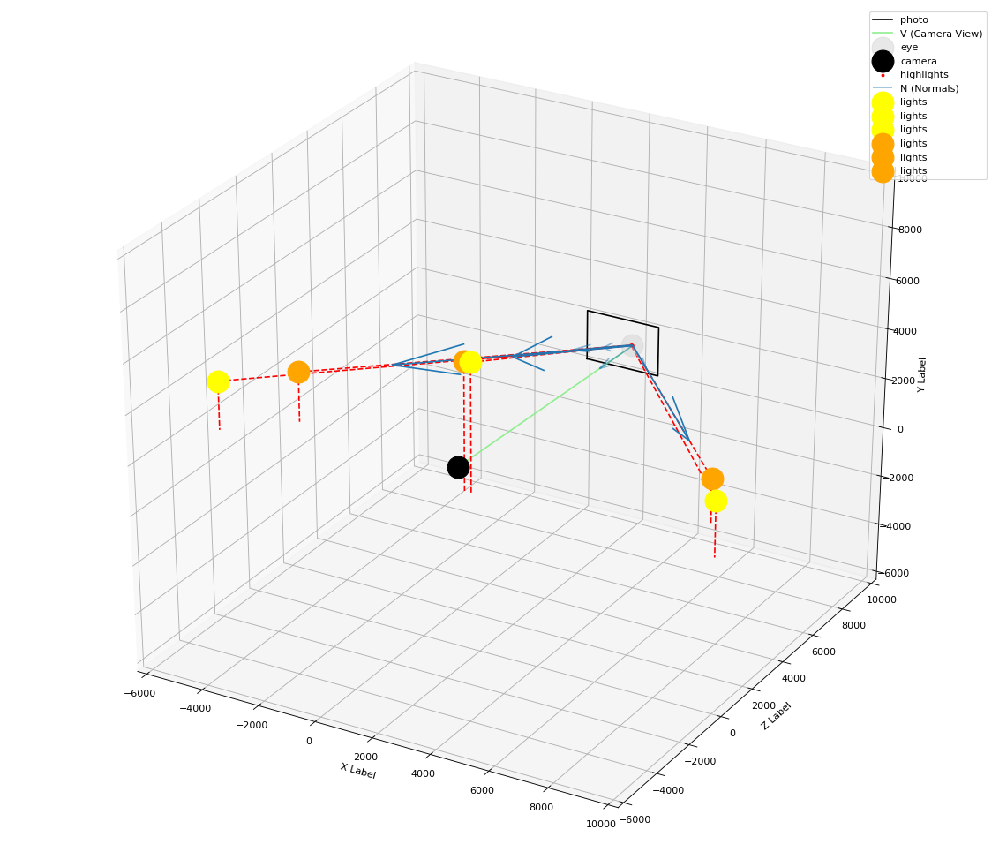

In [24]:
t.plot()

In [25]:
t.get_light_positions_mm()

on the same plane
0.87141207678 2.67334977916 5.163134426500375
-3.68392601147 1.0099420805 5.163134426500375
5.07987896434 1.14074214179 5.163134426500375


In [26]:
t.get_light_positions_mm_triangle()

same distance
0.754719139916 2.67334977916 5.1631344265
4.50245706741 0.91658956612 4.20200047471
-2.75880235968 1.03370694301 4.28839514884
